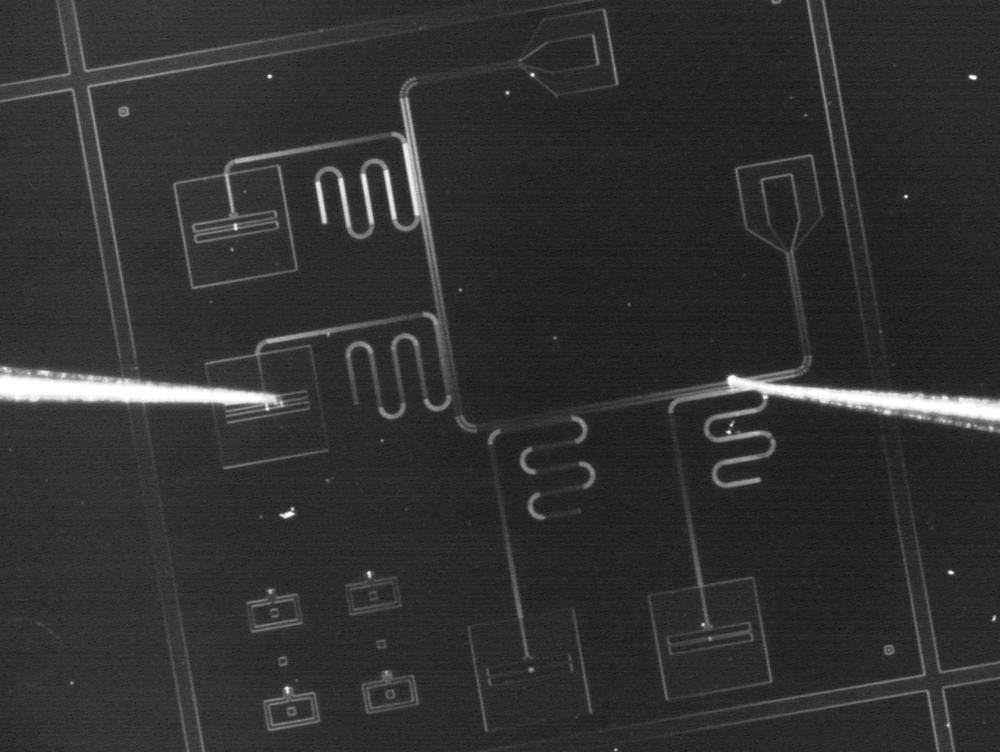

In [1191]:
import cv2
import numpy as np
from IPython import display
from matplotlib import pyplot as plt

def imshow(img, format=".jpg", **kwargs):
    """ndarray 配列をインラインで Notebook 上に表示する。"""
    img = cv2.imencode(format, img)[1]
    img = display.Image(img, **kwargs)
    display.display(img)

# file_name='images/20250117174320.jpg' # Qubit
file_name='images/20250117232225.jpg' # Qubit

threshold = 45
noise_threshold = 21 # 15
canny_threshold = 0

img=cv2.imread(file_name)
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
imshow(gray)

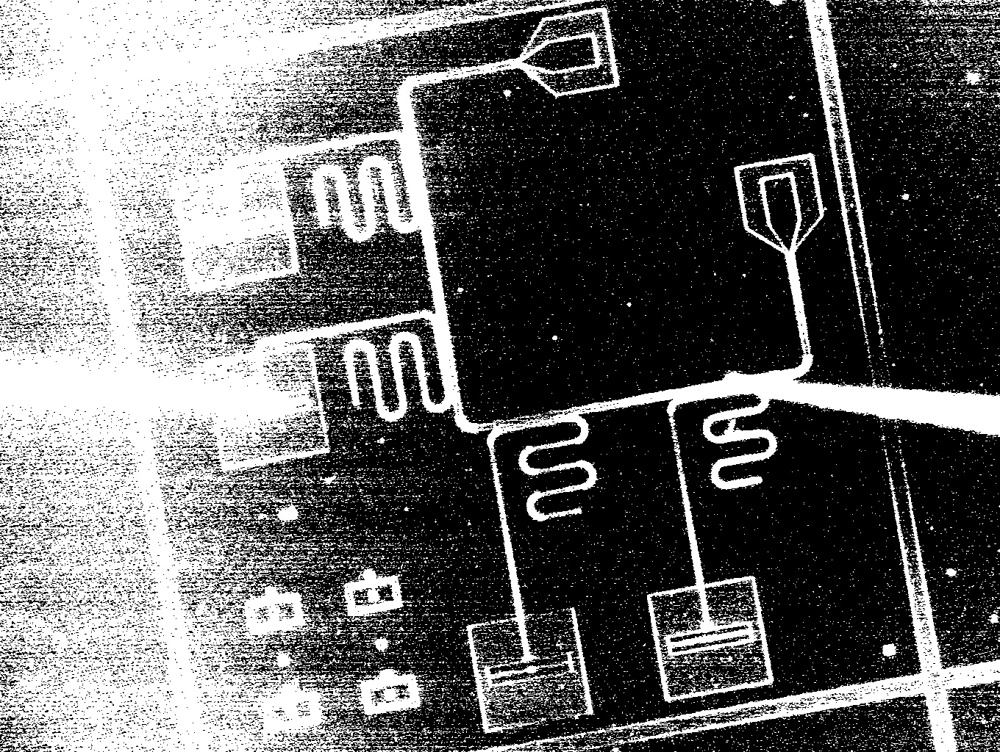

In [1192]:
h,w=gray.shape[:2]
#二値化処理
thresh, gray_thresh = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY)
imshow(gray_thresh)

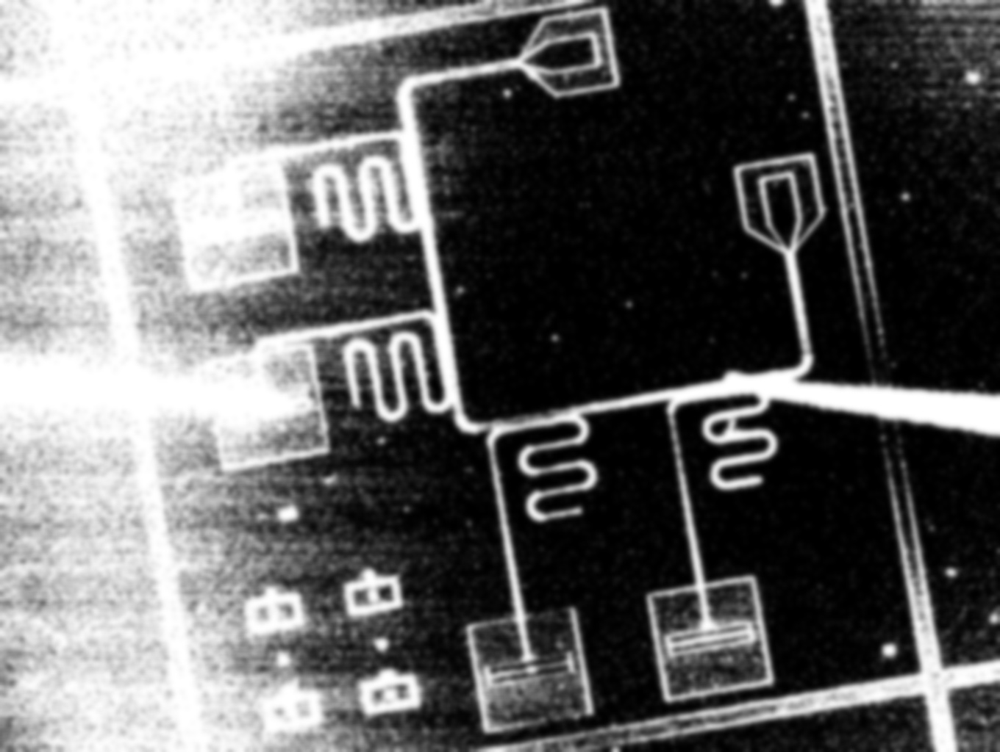

In [1193]:
#ノイズ除去
gray_thresh = cv2.GaussianBlur(gray_thresh, (noise_threshold, noise_threshold), 0) # Remove noise
imshow(gray_thresh)

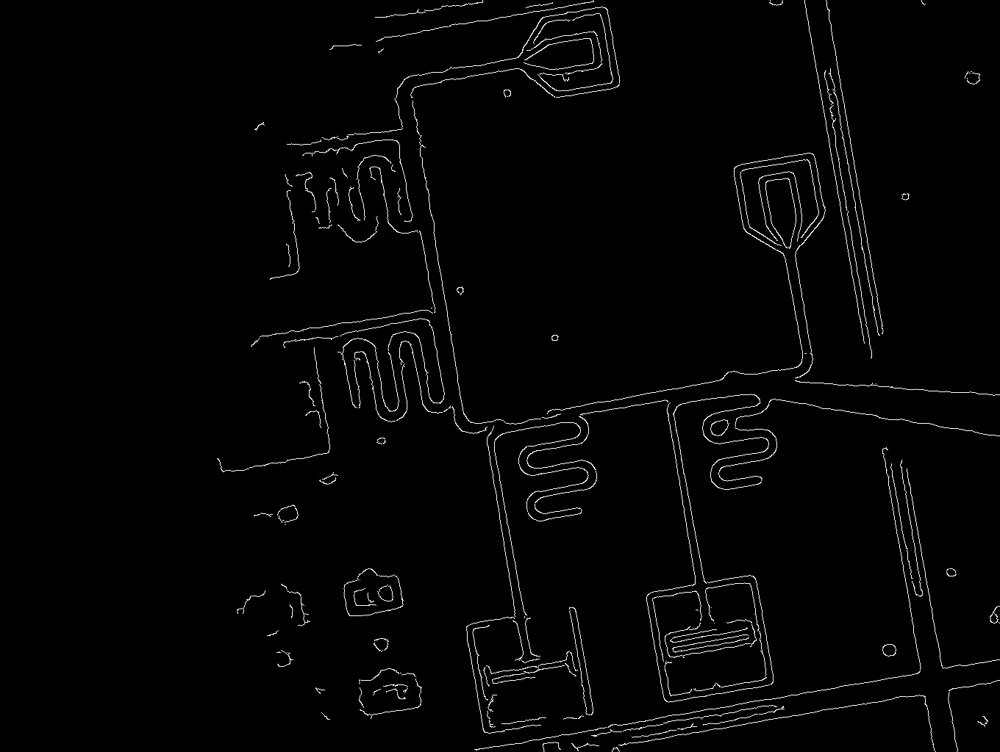

In [1194]:
# エッジ検出
edges = cv2.Canny(gray_thresh, canny_threshold, 150)
imshow(edges)

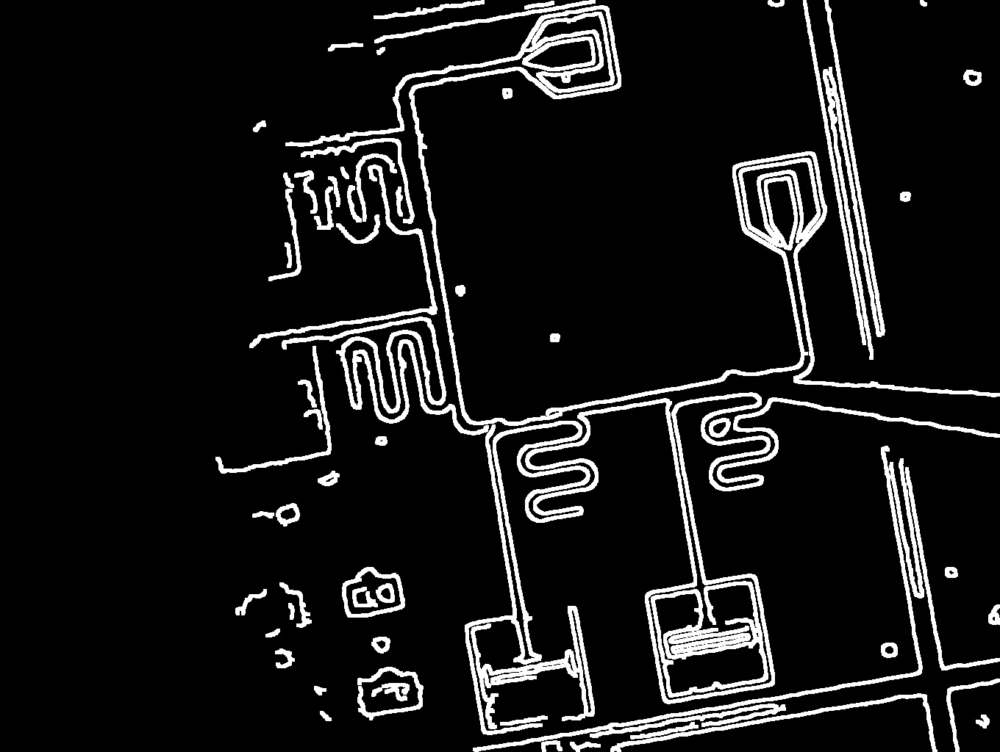

In [1195]:
# モルフォロジー変換でエッジを連結
# kernel = np.ones((10, 10), np.uint8)
kernel = np.ones((5, 5), np.uint8)
connected_edges = cv2.dilate(edges, kernel, iterations=1)
# connected_edges = cv2.erode(connected_edges, kernel, iterations=1)
imshow(connected_edges)

Found 347 Hough lines


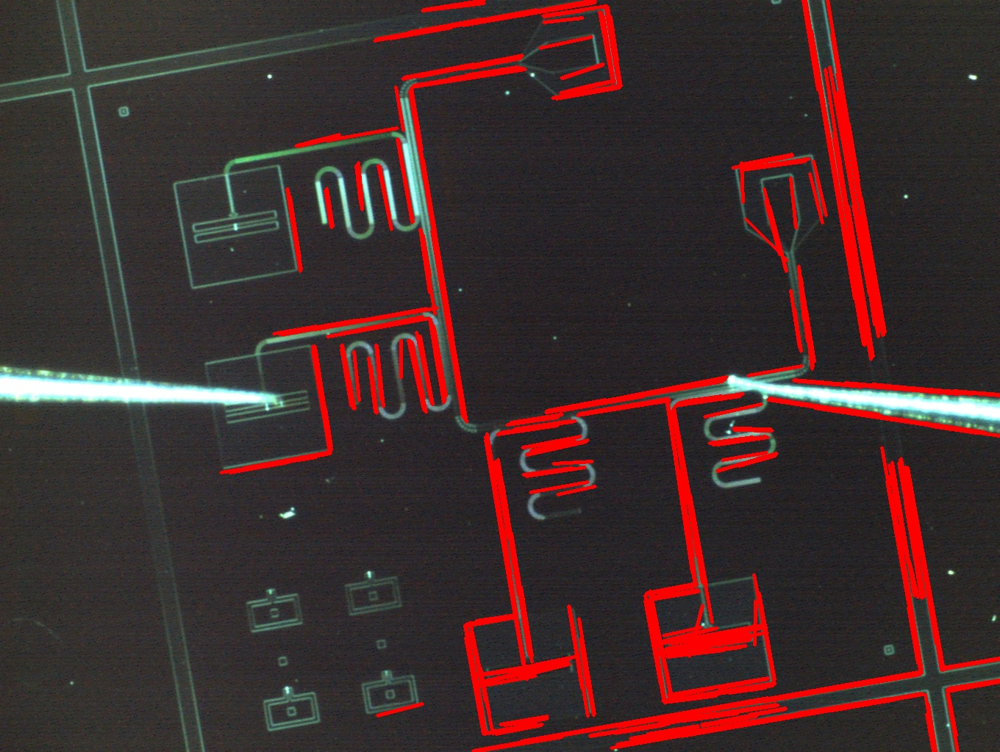

In [1196]:
lines = cv2.HoughLinesP(connected_edges, 
                        rho=1, 
                        theta=np.pi/360, 
                        threshold=80, 
                        minLineLength=50, 
                        maxLineGap=2)
print( f"Found {len(lines)} Hough lines")

import copy
img_copy = copy.copy(img)
for line in lines:
    x1, y1, x2, y2 = line[0]

    # 赤線を引く
    cv2.line(img_copy, (x1,y1), (x2,y2), (0,0,255), 3)

imshow(img_copy)

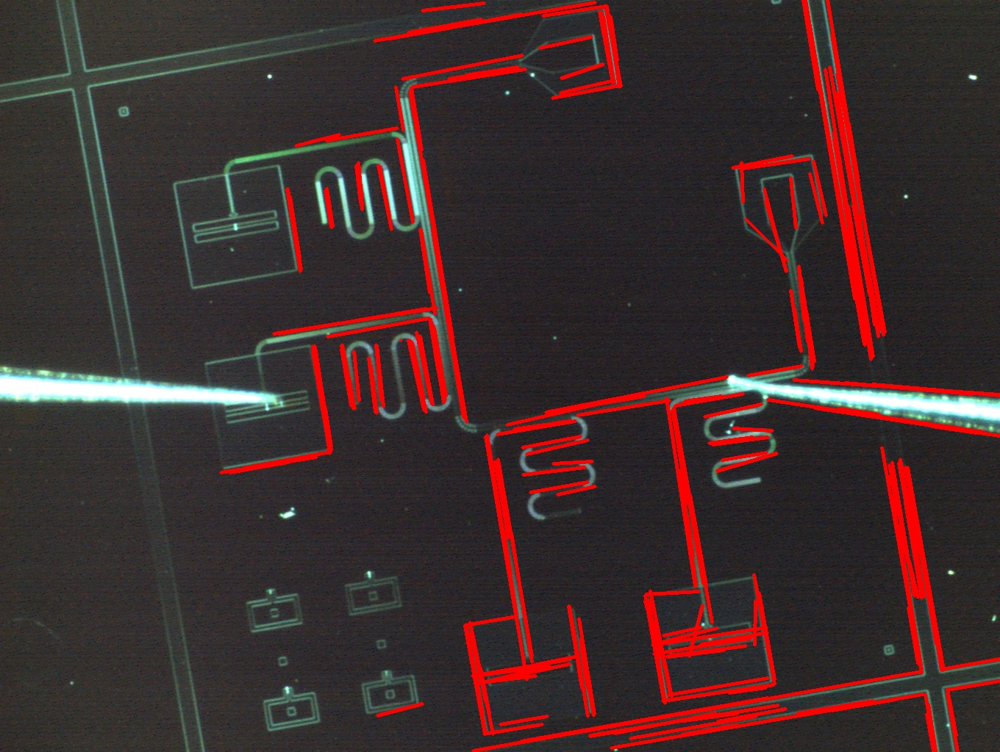

In [1197]:
# 線分をマージ
def merge_lines(lines, slope_threshold=0.1, intercept_threshold=50):
    def calculate_slope_intercept(x1, y1, x2, y2):
        # 傾きと切片を計算
        if x2 - x1 == 0:  # 垂直線の場合
            return float('inf'), x1
        slope = (y2 - y1) / (x2 - x1)
        intercept = y1 - slope * x1
        return slope, intercept
    
    def distance(x1, y1, x2, y2):
        return np.sqrt((x1 - x2)**2 + (y1 - y2)**2)

    def are_endpoints_close(lineA, lineB, threshold = 10):
        x1, y1, x2, y2 = lineA[0]
        x3, y3, x4, y4 = lineB[0]
        dist = min([distance(x1, y1, x3, y3), distance(x1, y1, x4, y4), distance(x2, y2, x3, y3), distance(x2, y2, x4, y4)])
        if dist < threshold:
            return True
        return False

    merged_lines = []
    used = [False] * len(lines)

    for i, line1 in enumerate(lines):
        if used[i]:
            continue

        x1, y1, x2, y2 = line1[0]
        slope1, intercept1 = calculate_slope_intercept(x1, y1, x2, y2)
        current_group = [(x1, y1, x2, y2)]

        for j, line2 in enumerate(lines):
            if i == j or used[j]:
                continue

            x3, y3, x4, y4 = line2[0]
            slope2, intercept2 = calculate_slope_intercept(x3, y3, x4, y4)

            # 傾きと切片が近ければ同じ直線と判定
            if abs(slope1 - slope2) < slope_threshold and abs(intercept1 - intercept2) < intercept_threshold:
                # if abs(slope1 - slope2) < slope_threshold:
                if are_endpoints_close(line1, line2):
                    current_group.append((x3, y3, x4, y4))
                    used[j] = True

        # グループ化した線分を1本にマージ
        x_coords = [x1 for x1, y1, x2, y2 in current_group] + [x2 for x1, y1, x2, y2 in current_group]
        y_coords = [y1 for x1, y1, x2, y2 in current_group] + [y2 for x1, y1, x2, y2 in current_group]
        xmin_index = x_coords.index(min(x_coords))
        xmax_index = x_coords.index(max(x_coords))
        merged_lines.append([(x_coords[xmin_index], y_coords[xmin_index],x_coords[xmax_index], y_coords[xmax_index])])

    return merged_lines

# マージされた直線の取得
merged_lines = merge_lines(lines)

img_copy = copy.copy(img)
for line in merged_lines:
    x1, y1, x2, y2 = line[0]

    # 赤線を引く
    cv2.line(img_copy, (x1,y1), (x2,y2), (0,0,255), 3)

imshow(img_copy)

In [1198]:
#輪郭抽出
# contours, hierarchy = cv2.findContours(gray_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# contours, hierarchy = cv2.findContours(connected_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# contours, hierarchy = cv2.findContours(connected_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_L1)
contours, hierarchy = cv2.findContours(connected_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)
# contours, hierarchy = cv2.findContours(gray_thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
print(len(contours))

214


In [1199]:
# 近似輪郭を作成
# approx_contours = []
# epsilon_factor = 0.0005  # 許容誤差のスケール（元の輪郭長さの割合）

# for contour in contours:
#     # epsilon を計算
#     epsilon = epsilon_factor * cv2.arcLength(contour, True)
    
#     # 輪郭を直線で近似
#     approx = cv2.approxPolyDP(contour, epsilon, True)
#     approx_contours.append(approx)

Contour 0: Area = 243.5
Contour 1: Area = 216.0
Contour 2: Area = 312.5
Contour 3: Area = 185.5
Contour 4: Area = 99.0
Contour 5: Area = 2916.5
Contour 6: Area = 120.0
Contour 7: Area = 564.5
Contour 8: Area = 744.0
Contour 9: Area = 1344.0
Contour 10: Area = 296.0
Contour 11: Area = 397.0
Contour 12: Area = 102.5
Contour 13: Area = 433.0
Contour 14: Area = 97.0
Contour 15: Area = 112.5
Contour 16: Area = 5508.5
Contour 17: Area = 0.0
Contour 18: Area = 0.0
Contour 19: Area = 0.0
Contour 20: Area = 66.5
Contour 21: Area = 0.0
Contour 22: Area = 0.0
Contour 23: Area = 0.0
Contour 24: Area = 0.0
Contour 25: Area = 116.5
Contour 26: Area = 24.0
Contour 27: Area = 0.0
Contour 28: Area = 0.0
Contour 29: Area = 0.0
Contour 30: Area = 0.0
Contour 31: Area = 0.0
Contour 32: Area = 66.5
Contour 33: Area = 506.5
Contour 34: Area = 296.5
Contour 35: Area = 11.0
Contour 36: Area = 120.0
Contour 37: Area = 351.5
Contour 38: Area = 530.5
Contour 39: Area = 15743.5
Contour 40: Area = 0.0
Contour 41: 

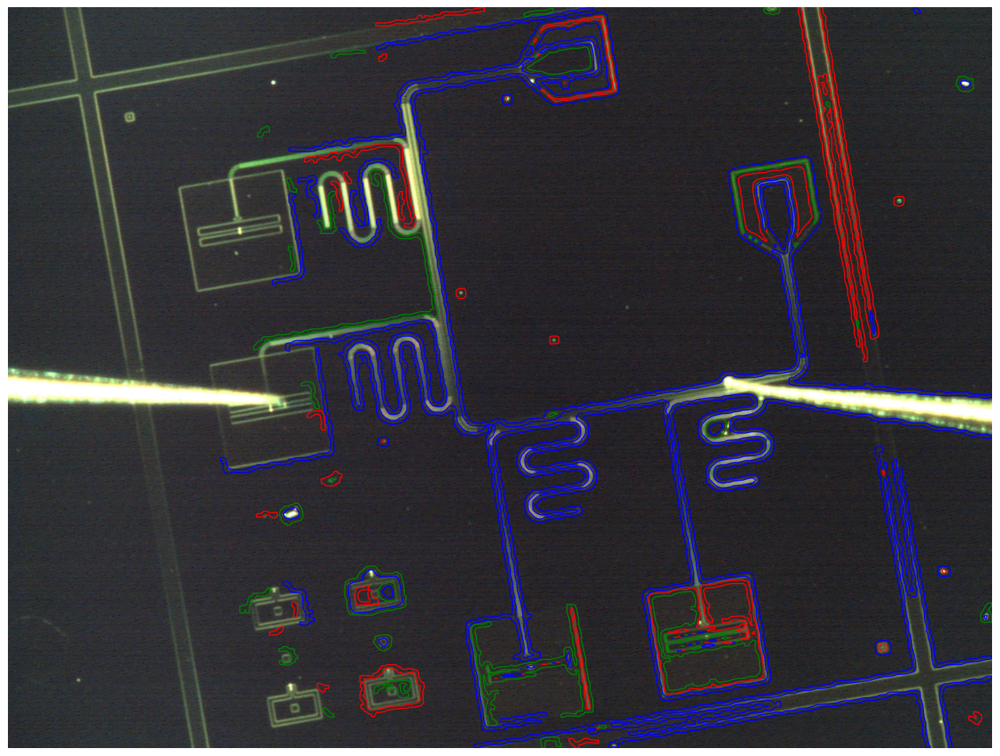

In [1200]:

def draw_contours(ax, img, contours):
    ax.imshow(img.copy())
    ax.set_axis_off()

    for i, cnt in enumerate(contours):
        # if len(cnt) < 100:
        #    continue

        area = cv2.contourArea(cnt)  # 面積を計算
        # if area < 1000:
        #     continue
        print(f"Contour {i}: Area = {area}")

        # 形状を変更する。(NumPoints, 1, 2) -> (NumPoints, 2)
        cnt = cnt.squeeze(axis=1)
        # 輪郭の点同士を結ぶ線を描画する。
        if i % 3 == 0:
            ax.add_patch(plt.Polygon(cnt, color="r", fill=None, lw=1))
        elif i % 3 == 1:
            ax.add_patch(plt.Polygon(cnt, color="g", fill=None, lw=1))            
        else:
            ax.add_patch(plt.Polygon(cnt, color="b", fill=None, lw=1))            
        # 輪郭の点を描画する。
        # ax.plot(cnt[:, 0], cnt[:, 1], "bo", mew=0, ms=2)
        # 輪郭の番号を描画する。
        # ax.text(cnt[0][0], cnt[0][1], i, color="r", size="20", bbox=dict(fc="w"))


fig, ax = plt.subplots(figsize=(16, 16))
draw_contours(ax, img, contours)

plt.show()

[[[  0   0]]

 [[ 50   0]]

 [[ 50 100]]

 [[ 25 150]]

 [[  0 100]]]
296.5 0.49225256459952926
354.5 0.45842587378992367
128.0 0.14527562600260385
2135.5 0.07924063917732876
2190.0 0.11991404446240195


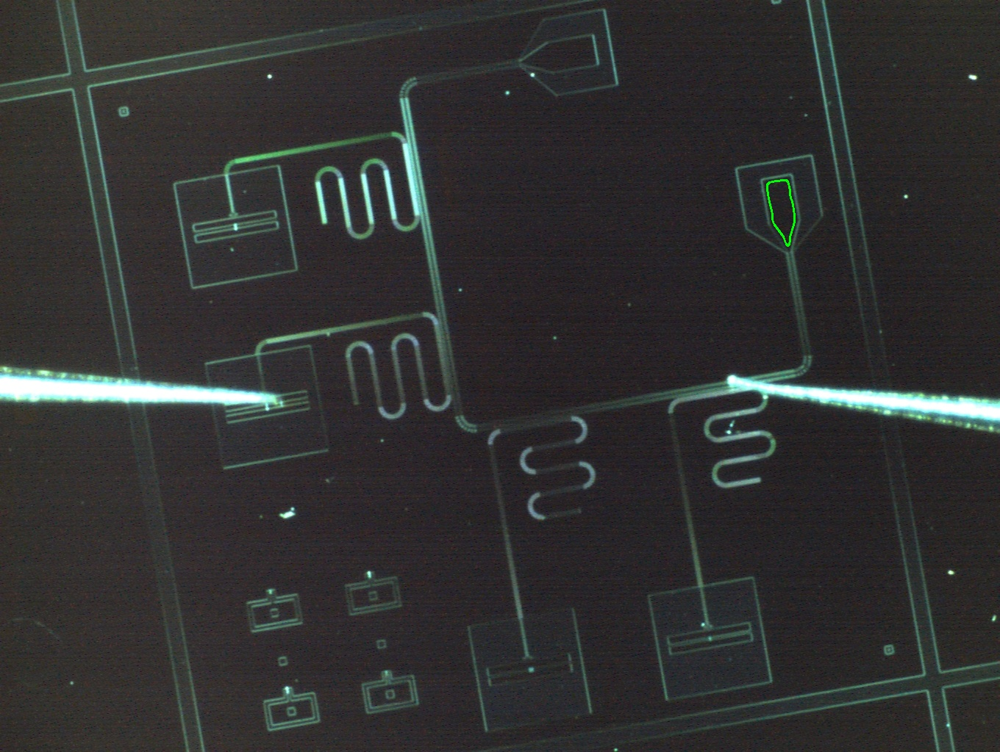

79.66023111672081


In [1201]:
# launch pad を探す
template_contour = np.array([[0, 0], [50, 0], [50, 100], [25, 150], [0, 100]], dtype=np.int32).reshape((-1, 1, 2)) # launch pad の形状
print(template_contour)
image_with_launchpad = img.copy()  # 元の画像を保持するためコピーを作成
similaritylist = []
contourlist = []
for contour in contours:
    # Hu モーメントを使って形状の一致度を計算
    area = cv2.contourArea(contour)  # 面積を計算
    similarity = cv2.matchShapes(template_contour, contour, cv2.CONTOURS_MATCH_I1, 0)
    if area < 100:
        continue
    contourlist.append(contour)
    similaritylist.append(similarity)
    if similarity < 0.5:  # 閾値は調整可能
        print(area, similarity)

mostsimilar_index = similaritylist.index( min(similaritylist) )
best_contour = contourlist[mostsimilar_index]
cv2.drawContours(image_with_launchpad, [ best_contour ], -1, (0, 255, 0), 2)
imshow(image_with_launchpad)

M = cv2.moments(best_contour)
if M["m00"] != 0:
    # 重心を計算
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    
    # 主軸の角度を計算 (rad -> deg に変換)
    angle = 0.5 * np.arctan2(2 * M["mu11"], M["mu20"] - M["mu02"])
    angle_deg = np.degrees(angle)
    print(angle_deg)

angle_offset = 0
if angle_deg > 45:
    angle_offset = 90

15743.5 0.1505583948898046
27411.0 4.194281729800532
35696.5 5.501827297839768


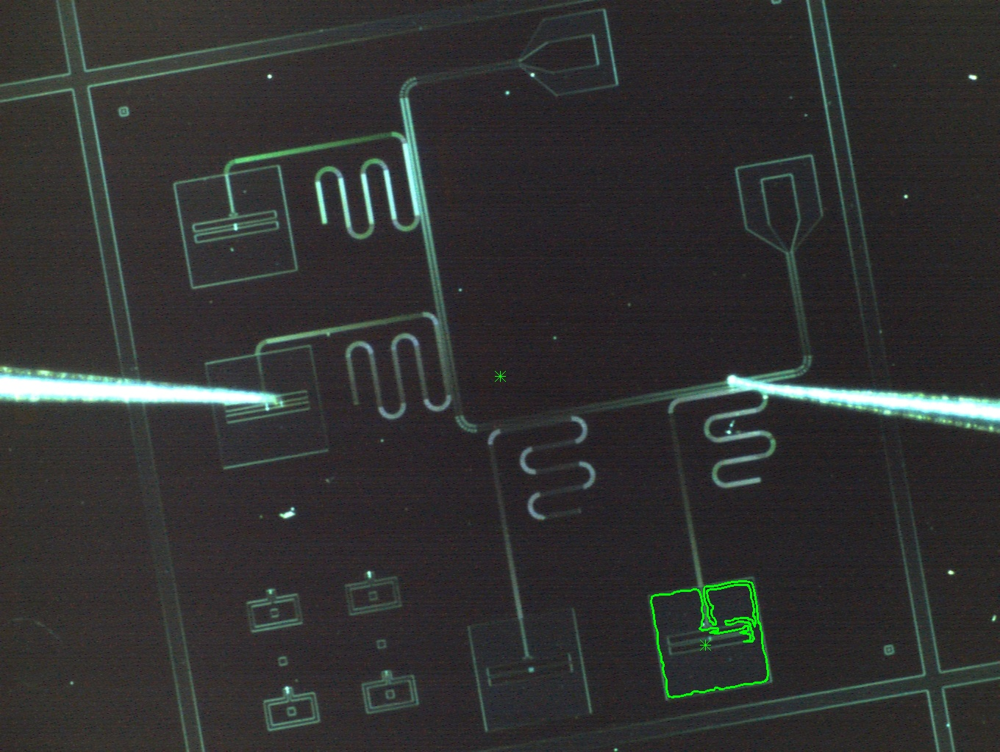

In [1202]:
# qubit を探す
template_contour = np.array([[0, 0], [50, 0], [50, 50], [0, 50]], dtype=np.int32).reshape((-1, 1, 2)) # launch pad の形状
image_with_qubit = img.copy()  # 元の画像を保持するためコピーを作成
similaritylist = []
contourlist = []
for contour in contours:
    # Hu モーメントを使って形状の一致度を計算
    area = cv2.contourArea(contour)  # 面積を計算
    similarity = cv2.matchShapes(template_contour, contour, cv2.CONTOURS_MATCH_I1, 0)
    if area < 10000:
        continue
    contourlist.append(contour)
    similaritylist.append(similarity)
    print(area, similarity)
mostsimilar_index = similaritylist.index( min(similaritylist) )
best_contour = contourlist[mostsimilar_index]
cv2.drawContours(image_with_qubit, [ best_contour ], -1, (0, 255, 0), 2)

M = cv2.moments(best_contour)
if M["m00"] != 0:
    # 重心を計算
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])

# plot center
cv2.drawMarker(image_with_qubit, center, (0, 255, 0), markerType=cv2.MARKER_STAR, markerSize=15)
cv2.drawMarker(image_with_qubit, (cx, cy), (0, 255, 0), markerType=cv2.MARKER_STAR, markerSize=15)

imshow(image_with_qubit)

gaussian fit : mean = -9.908
array mean   : mean = -4.934
freq mean    : mean = -10.350


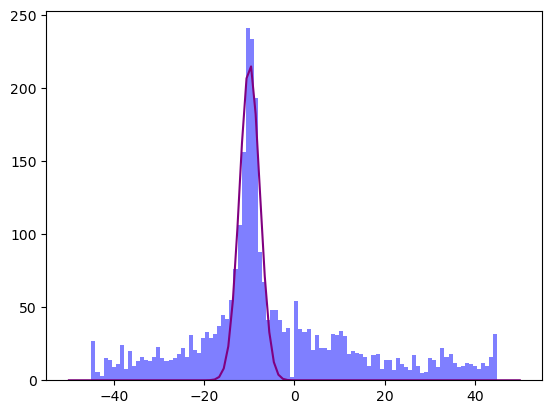

In [1203]:
# contour の全ての点の傾きからどれくらい傾いているか求める
import math
nskip = 10
anglelist = []
def calculate_slope(p1, p2):
    # 傾きと切片を計算
    x1 = p1[0]
    x2 = p2[0]
    y1 = p1[1]
    y2 = p2[1]
    if x2 - x1 == 0:  # 垂直線の場合
        # return float('inf'), x1
        return float('inf')
    slope = (y2 - y1) / (x2 - x1)
    return slope

for i, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)  # 面積を計算
    # if area < 1000:
    #     continue
    for ipoint in range(int(len(cnt)/nskip)-1): # 10点おきに傾きを計算
        for i in range(nskip):
            angle = math.degrees(math.atan(calculate_slope(cnt[nskip*ipoint+i][0], cnt[nskip*(ipoint+1)-1+i][0])))
            if angle > 45:
                continue
                # angle = angle - 90
            elif angle < -45:
                continue
                # angle = angle + 90
            anglelist.append( angle )

%matplotlib inline
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import numpy as np
counts, bins, _ = plt.hist(anglelist, bins=100, color='blue', alpha=0.5)

#define function to fit
def gaussian(x, a, mu, sigma):
    return a*np.exp(-(x-mu)**2/(2*sigma**2))

#calculate bin center to use as y data to fit
bins_center = (bins[:-1] + np.diff(bins) / 2)
param, cov = curve_fit(gaussian, bins_center,counts, p0=(10,0,1))
x_values_to_fit = np.linspace(-50,50,100)
plt.plot(x_values_to_fit, gaussian(x_values_to_fit, *param), '-', color = 'purple', lw=1.5, label = "Gaussian")

# access fit parameters
amp_gaus  = param[0] #amplitude 
mean_gaus = param[1] #mean of gaussian dist
std_gau   = param[2] #stdev of the dist

mean_array = np.mean(anglelist)
mean_freq = bins_center[ np.argmax( counts ) ]

print("gaussian fit : mean = {0:.3f}".format(mean_gaus))
print("array mean   : mean = {0:.3f}".format(mean_array))
print("freq mean    : mean = {0:.3f}".format(mean_freq))


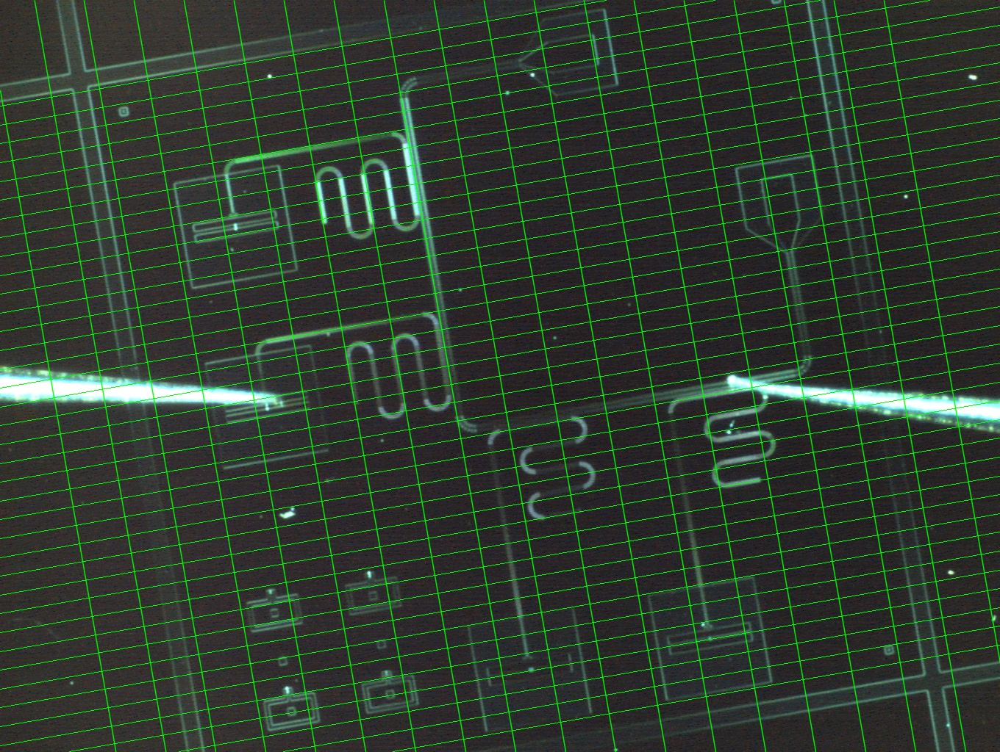

In [1204]:
# mean = mean_freq
mean = mean_gaus

# 画像のサイズを取得
height, width, _ = img.shape

# 直線のパラメータを設定
num_lines_x = 20  # 縦方向のグリッドライン数
num_lines_y = 40   # 横方向のグリッドライン数
horiz_rad = np.radians( mean )
perp_rad = np.radians( mean + 90 )

# 画像に直線を描画
image_with_line = img.copy()  # 元の画像を保持するためコピーを作成
color = (0, 255, 0)  # 緑色 (B, G, R)
thickness = 1  # 線の太さ

for i in range(1, num_lines_y):
    y = i * height // num_lines_y
    # center = (width // 2, height // 2)  # 画像の中心
    center = (width // 2, y)  # 画像の中心

    length = width  # 直線の長さ
    x1 = int(center[0] - length * np.cos(horiz_rad))
    y1 = int(center[1] - length * np.sin(horiz_rad))
    x2 = int(center[0] + length * np.cos(horiz_rad))
    y2 = int(center[1] + length * np.sin(horiz_rad))
    # print(x1, y1, x2, y2)

    # 直線を描画
    cv2.line(image_with_line, (x1, y1), (x2, y2), color, thickness)

for j in range(1, num_lines_x):
    x = j * width // num_lines_x
    # center = (width // 2, height // 2)  # 画像の中心
    center = (x, height // 2 )  # 画像の中心

    length = height  # 直線の長さ
    x1 = int(center[0] - length * np.cos(perp_rad))
    y1 = int(center[1] - length * np.sin(perp_rad))
    x2 = int(center[0] + length * np.cos(perp_rad))
    y2 = int(center[1] + length * np.sin(perp_rad))
    # print(x1, y1, x2, y2)

    # 直線を描画
    line_type = cv2.LINE_AA
    cv2.line(image_with_line, (x1, y1), (x2, y2), color, thickness, line_type)

imshow(image_with_line)

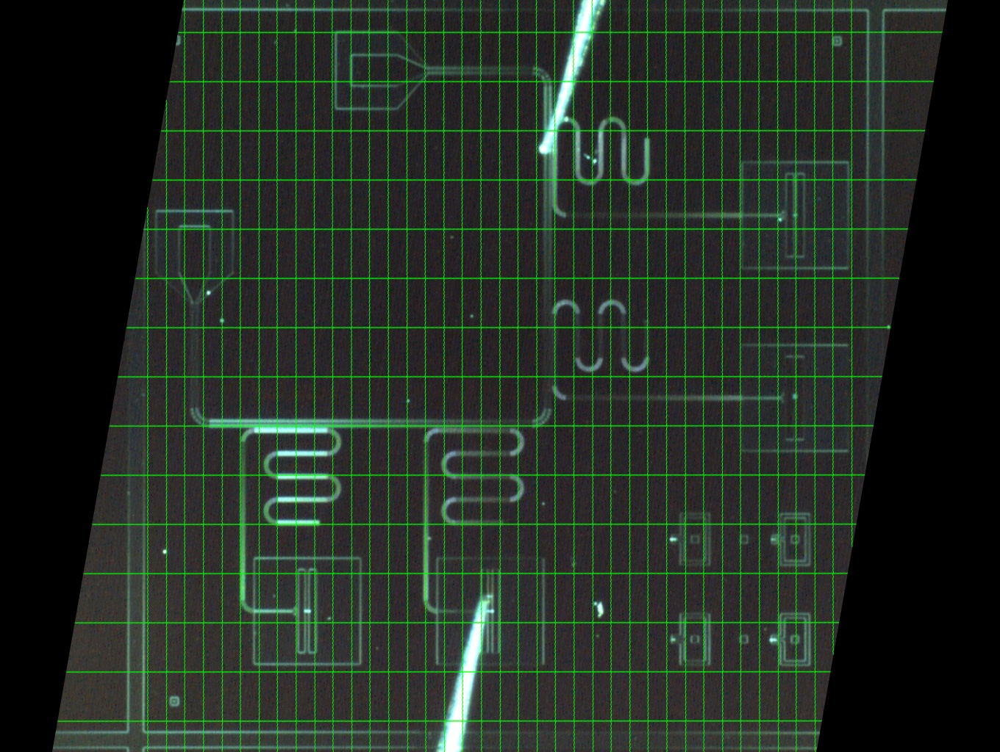

In [1205]:
# 画像の回転
height, width = image_with_line.shape[:2]

# 回転の中心 (画像の中心を指定)
center = (width // 2, height // 2)

# 回転角度 (時計回り: 負の値, 反時計回り: 正の値)
angle = mean + angle_offset # 例: 45度

# スケール (1.0: サイズ維持, >1.0: 拡大, <1.0: 縮小)
scale = 1.0

# 回転行列を計算
rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale)

# 回転を適用
rotated_image = cv2.warpAffine(image_with_line, rotation_matrix, (width, height))

imshow(rotated_image)

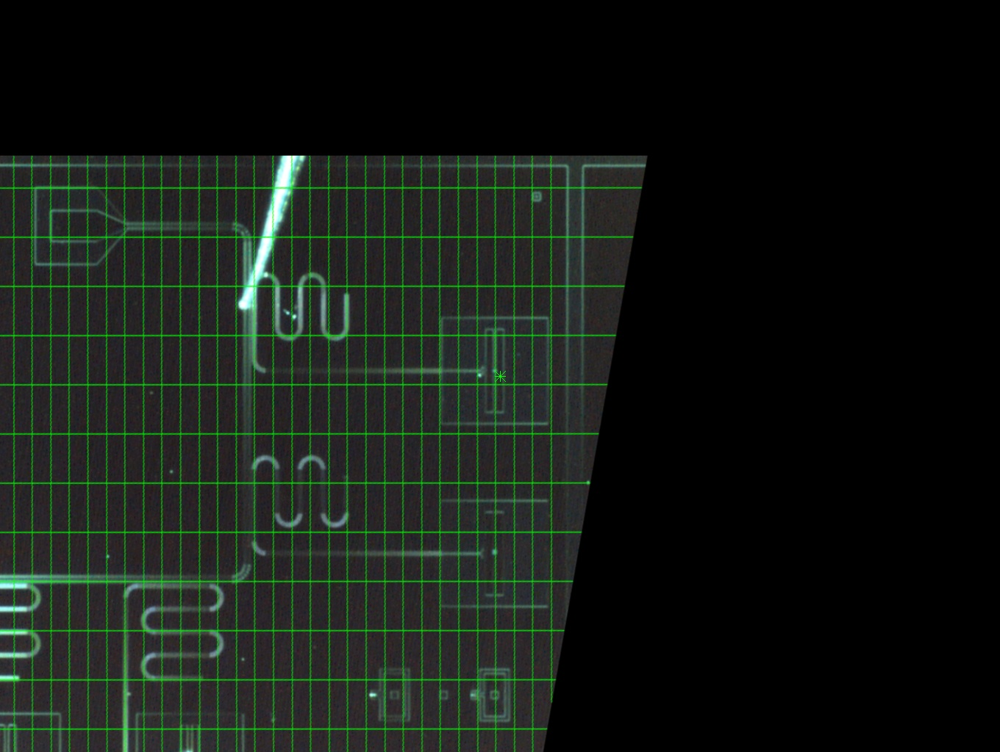

In [1206]:
# 画像の移動
tx, ty = center[0] - cx, center[1] - cy

# 回転行列を定義
theta_rad = math.radians(-angle)
rotation_matrix = np.array([
    [math.cos(theta_rad), -math.sin(theta_rad)],
    [math.sin(theta_rad), math.cos(theta_rad)]
])

# 平行移動ベクトル
translation_vector = np.array([tx, ty])

# 回転を適用
rotated_translation = np.dot(rotation_matrix, translation_vector)

# 結果
rotated_tx, rotated_ty = rotated_translation

# 平行移動行列を作成
M = np.float32([[1, 0, rotated_tx], [0, 1, rotated_ty]])

# 画像の移動 (アフィン変換)
shifted_image = cv2.warpAffine(rotated_image, M, (rotated_image.shape[1], rotated_image.shape[0]))

cv2.drawMarker(shifted_image, center, (0, 255, 0), markerType=cv2.MARKER_STAR, markerSize=15)

imshow(shifted_image)